In [1]:
# !pip install pyparsing==2.4.6
# !pip install tensorflow

In [2]:
import sys
sys.path.append("../utils/") 
from utilities import performance_metrics
import time

from src.core import Term, Atom
from src.ilp import Language_Frame, Program_Template, Rule_Template
from src.dilp import DILP
import tensorflow as tf
import numpy as np
from src.utils import process_file, process_dir, create_table, output_rules, test_rule, train, test
from src.generate_template import create_templates
import duckdb
tf.random.set_seed(1000)
np.random.seed(1000)

import dill


2024-05-20 17:44:03.967629: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-20 17:44:04.920886: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
# arity 1
term_x_0 = Term(True, 'X_0')

In [4]:
con = duckdb.connect(':memory:')
# enable automatic query parallelization
con.execute("PRAGMA threads=2")
# enable caching of parquet metadata
con.execute("PRAGMA enable_object_cache")

## Fraud

In [21]:
%%time 
input_dir = '../examples/fraud-symb'
target, p_e, constants, B, P, N = process_dir(input_dir)
language_frame = Language_Frame(target, p_e, constants)

464
end of facts processing
100
end of positive examples processing
100
end negative examples processing
data is in order
CPU times: user 189 ms, sys: 7 µs, total: 189 ms
Wall time: 189 ms


In [14]:
input_table=create_table(con, input_dir, 'df')
print(f'ratio of positives %f' % (100*input_table['isFraud'].sum()/len(input_table)))
print(f'N= %f' % (len(input_table)))

previous table dropped
ratio of positives 50.000000
N= 200.000000


In [6]:
T=5
p_a, rules = create_templates(p_e[0:3], target, term_x_0)
program_template = Program_Template(p_a, rules, T=T)
dilp_p3_T5 = DILP(language_frame, B, P, N, program_template, allow_target_recursion=True)
train(dilp_p3_T5)

Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
--------------------
step 0 loss is 0.9963563680648804
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
isFraud(36) Expected: 0 0.017
isFraud(125) Expected: 1 0.205
isFraud(168) Expected: 1 0.205
isFraud(188) Expected: 1 0.159
isFraud(34) Expected: 0 0.205
isFraud(194) Expected: 1 0.519
isFraud(15) Expected: 0 0.159
isFraud(7) Expected: 0 0.597
isFraud(79) Expected: 0 0.597
isFraud(1) Expected: 0 0.597
isFraud(17) Expected: 0 0.159
isFraud(129) Expected: 1 0.159
isFraud(0) Expected: 0 0.597
isFraud(31) Expected: 0 0.205
isFraud(137) Expected: 1 0.519
isFraud(23) Expected: 0 0.597
isFraud(61) Expected: 0 0.168
isFraud(40) Expected: 0 0.205
isFraud(111) Expected: 1 0.519
isFraud(44) Ex

previous table dropped
----------------------------
isFraud(X_0)
isFraud(X_0) -> pred1(X_0),pred1(X_0)
None
----------------------------
----------------------------
pred1(X_0)
pred1(X_0) -> type_TRANSFER(X_0),external_dest(X_0)
None
----------------------------
pred1 : type_TRANSFER external_dest
isFraud : pred1 pred1
select "type_TRANSFER" and "external_dest" as "pred1",
 "pred1" and "pred1" as "isFraud",

Accuracy: 0.999318
Precision TP/(TP+FP): 0.973846
Recall TP/(TP+FN): 0.501188
F1 Score: 0.661788
MCC Score: 0.698376


'select "type_TRANSFER" and "external_dest" as "pred1",\n "pred1" and "pred1" as "isFraud",\n'

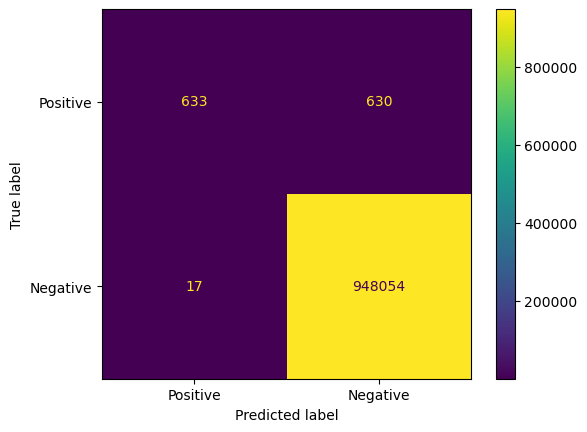

In [22]:
test(dilp_p3_T5, create_table(con, input_dir, 'df_test'), con)

previous table dropped
----------------------------
isFraud(X_0)
isFraud(X_0) -> pred1(X_0),pred1(X_0)
None
----------------------------
----------------------------
pred1(X_0)
pred1(X_0) -> type_TRANSFER(X_0),external_dest(X_0)
None
----------------------------
pred1 : type_TRANSFER external_dest
isFraud : pred1 pred1
select "type_TRANSFER" and "external_dest" as "pred1",
 "pred1" and "pred1" as "isFraud",

Accuracy: 0.715000
Precision TP/(TP+FP): 1.000000
Recall TP/(TP+FN): 0.430000
F1 Score: 0.601399
MCC Score: 0.523341


'select "type_TRANSFER" and "external_dest" as "pred1",\n "pred1" and "pred1" as "isFraud",\n'

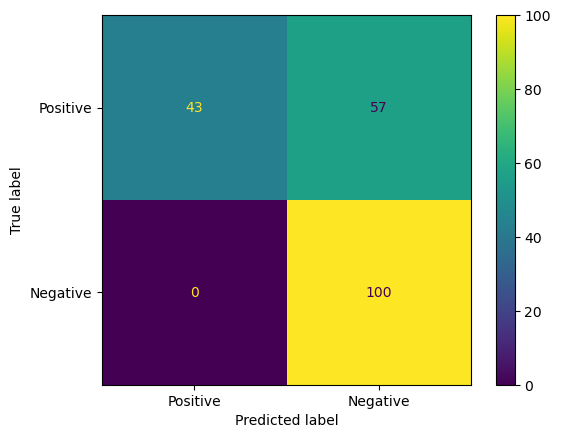

In [8]:
test(dilp_p3_T5, create_table(con, input_dir, 'df'), con)

# create all possible predicates

In [9]:
T=5
p_a, rules = create_templates(p_e[0:4], target, term_x_0)
program_template = Program_Template(p_a, rules, T=T)
dilp_p4_T5 = DILP(language_frame, B, P, N, program_template, allow_target_recursion=True)
train(dilp_p4_T5)

Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
--------------------
step 0 loss is 1.0883759260177612
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
isFraud(36) Expected: 0 0.002
isFraud(125) Expected: 1 0.139
isFraud(168) Expected: 1 0.139
isFraud(188) Expected: 1 0.309
isFraud(34) Expected: 0 0.139
isFraud(194) Expected: 1 0.455
isFraud(15) Expected: 0 0.309
isFraud(7) Expected: 0 0.436
isFraud(79) Expected: 0 0.436
isFraud(1) Expected: 0 0.436
isFraud(17) Expected: 0 0.309
isFraud(129) Expected: 1 0.309
isFraud(0) Expected: 0 0.436
isFraud(31) Expected: 0 0.139
isFraud(137) Expected: 1 0.455
isFraud(23) Expected: 0 0.436
isFraud(61) Expected: 0 0.137
isFraud(40) Expected: 0 0.139
isFraud(111) Expected: 1 0.455
isFraud(44) Ex

previous table dropped
----------------------------
isFraud(X_0)
isFraud(X_0) -> pred2(X_0),pred2(X_0)
None
----------------------------
----------------------------
pred1(X_0)
pred1(X_0) -> pred2(X_0),external_dest(X_0)
None
----------------------------
----------------------------
pred2(X_0)
pred2(X_0) -> type_TRANSFER(X_0),external_dest(X_0)
None
----------------------------
pred2 : type_TRANSFER external_dest
pred1 : pred2 external_dest
isFraud : pred2 pred2
select "type_TRANSFER" and "external_dest" as "pred2",
 "pred2" and "external_dest" as "pred1",
 "pred2" and "pred2" as "isFraud",

Accuracy: 0.999318
Precision TP/(TP+FP): 0.973846
Recall TP/(TP+FN): 0.501188
F1 Score: 0.661788
MCC Score: 0.698376


'select "type_TRANSFER" and "external_dest" as "pred2",\n "pred2" and "external_dest" as "pred1",\n "pred2" and "pred2" as "isFraud",\n'

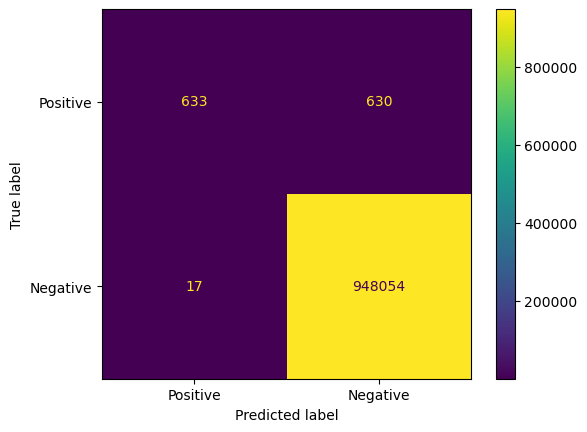

In [10]:
test(dilp_p4_T5, create_table(con, input_dir, 'df_test'), con)

previous table dropped
----------------------------
isFraud(X_0)
isFraud(X_0) -> pred2(X_0),pred2(X_0)
None
----------------------------
----------------------------
pred1(X_0)
pred1(X_0) -> pred2(X_0),external_dest(X_0)
None
----------------------------
----------------------------
pred2(X_0)
pred2(X_0) -> type_TRANSFER(X_0),external_dest(X_0)
None
----------------------------
pred2 : type_TRANSFER external_dest
pred1 : pred2 external_dest
isFraud : pred2 pred2
select "type_TRANSFER" and "external_dest" as "pred2",
 "pred2" and "external_dest" as "pred1",
 "pred2" and "pred2" as "isFraud",

Accuracy: 0.715000
Precision TP/(TP+FP): 1.000000
Recall TP/(TP+FN): 0.430000
F1 Score: 0.601399
MCC Score: 0.523341


'select "type_TRANSFER" and "external_dest" as "pred2",\n "pred2" and "external_dest" as "pred1",\n "pred2" and "pred2" as "isFraud",\n'

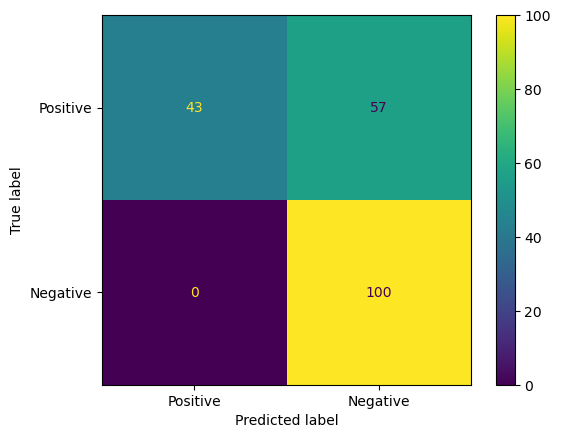

In [11]:
test(dilp_p4_T5, create_table(con, input_dir, 'df'), con)

In [16]:
dilp_p3_T5.program_template.rules

{pred1(X_0): (<src.ilp.template.rule_template.Rule_Template at 0x7f9107361850>,
  None),
 isFraud(X_0): (<src.ilp.template.rule_template.Rule_Template at 0x7f91073600d0>,
  None)}

In [20]:
dilp_p4_T5.program_template.rules

{pred1(X_0): (<src.ilp.template.rule_template.Rule_Template at 0x7f90e30f9cd0>,
  None),
 pred2(X_0): (<src.ilp.template.rule_template.Rule_Template at 0x7f90e314b7d0>,
  None),
 isFraud(X_0): (<src.ilp.template.rule_template.Rule_Template at 0x7f90e81781d0>,
  None)}

## 1% fraud data set

In [23]:
%%time 
input_dir = '../examples/fraud-symb-10-1000/'
target, p_e, constants, B, P, N = process_dir(input_dir)
language_frame = Language_Frame(target, p_e, constants)
input_table=create_table(con, input_dir, 'df')
print(f'ratio of positives %f' % (100*input_table['isFraud'].sum()/len(input_table)))
print(f'N= %f' % (len(input_table)))


2420
end of facts processing
10
end of positive examples processing
1000
end negative examples processing
data is in order
previous table dropped
ratio of positives 0.990099
N= 1010.000000
CPU times: user 2.82 s, sys: 16 ms, total: 2.83 s
Wall time: 2.83 s


In [24]:

T=5
p_a, rules = create_templates(p_e[0:3], target, term_x_0)
program_template = Program_Template(p_a, rules, T=T)
dilp_p3_T5_10_100 = DILP(language_frame, B, P, N, program_template, allow_target_recursion=True)
train(dilp_p3_T5_10_100)

Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
--------------------
step 0 loss is 1.0320712327957153
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
isFraud(168) Expected: 0 0.755
isFraud(272) Expected: 0 0.755
isFraud(551) Expected: 0 0.755
isFraud(34) Expected: 0 0.444
isFraud(471) Expected: 0 0.755
isFraud(826) Expected: 0 0.755
isFraud(916) Expected: 0 0.755
isFraud(791) Expected: 0 0.755
isFraud(496) Expected: 0 0.755
isFraud(588) Expected: 0 0.755
isFraud(137) Expected: 0 0.755
isFraud(491) Expected: 0 0.051
isFraud(40) Expected: 0 0.444
isFraud(906) Expected: 0 0.755
isFraud(476) Expected: 0 0.755
isFraud(812) Expected: 0 0.755
isFraud(379) Expected: 0 0.680
isFraud(562) Expected: 0 0.512
isFraud(197) Expected: 0 0.755
i

In [26]:
T=5
p_a, rules = create_templates(p_e[0:4], target, term_x_0)
program_template = Program_Template(p_a, rules, T=T)
dilp_p4_T5_10_100 = DILP(language_frame, B, P, N, program_template, allow_target_recursion=True)
train(dilp_p4_T5_10_100)

Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
--------------------
step 0 loss is 0.4161340594291687
Performing Inference
Progress: |██████████████████████████████████████████████████| 100.0% Complete
Inference Complete
isFraud(168) Expected: 0 0.481
isFraud(272) Expected: 0 0.481
isFraud(551) Expected: 0 0.481
isFraud(34) Expected: 0 0.035
isFraud(471) Expected: 0 0.481
isFraud(826) Expected: 0 0.481
isFraud(916) Expected: 0 0.481
isFraud(791) Expected: 0 0.481
isFraud(496) Expected: 0 0.481
isFraud(588) Expected: 0 0.481
isFraud(137) Expected: 0 0.481
isFraud(491) Expected: 0 0.040
isFraud(40) Expected: 0 0.035
isFraud(906) Expected: 0 0.481
isFraud(476) Expected: 0 0.481
isFraud(812) Expected: 0 0.481
isFraud(379) Expected: 0 0.157
isFraud(562) Expected: 0 0.027
isFraud(197) Expected: 0 0.481
i

previous table dropped
----------------------------
isFraud(X_0)
isFraud(X_0) -> pred2(X_0),pred2(X_0)
None
----------------------------
----------------------------
pred1(X_0)
pred1(X_0) -> pred2(X_0),type_CASH_OUT(X_0)
None
----------------------------
----------------------------
pred2(X_0)
pred2(X_0) -> type_TRANSFER(X_0),external_dest(X_0)
None
----------------------------
pred2 : type_TRANSFER external_dest
pred1 : pred2 type_CASH_OUT
isFraud : pred2 pred2
select "type_TRANSFER" and "external_dest" as "pred2",
 "pred2" and "type_CASH_OUT" as "pred1",
 "pred2" and "pred2" as "isFraud",

Accuracy: 0.996040
Precision TP/(TP+FP): 1.000000
Recall TP/(TP+FN): 0.600000
F1 Score: 0.750000
MCC Score: 0.773052


'select "type_TRANSFER" and "external_dest" as "pred2",\n "pred2" and "type_CASH_OUT" as "pred1",\n "pred2" and "pred2" as "isFraud",\n'

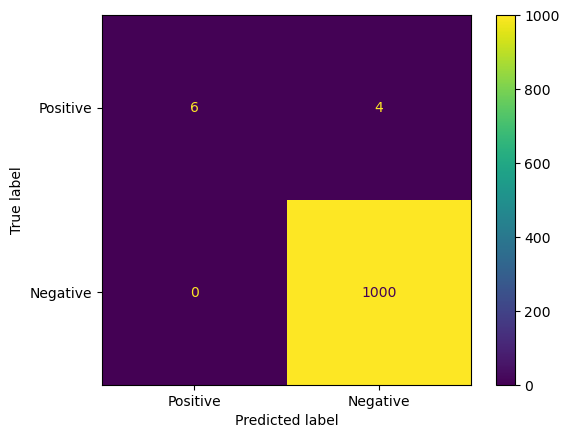

In [27]:
test(dilp_p4_T5_10_100, create_table(con, input_dir, 'df'), con)

----------------------------
isFraud(X_0)
isFraud(X_0) -> pred2(X_0),pred2(X_0)
None
----------------------------
----------------------------
pred1(X_0)
pred1(X_0) -> pred2(X_0),type_CASH_OUT(X_0)
None
----------------------------
----------------------------
pred2(X_0)
pred2(X_0) -> type_TRANSFER(X_0),external_dest(X_0)
None
----------------------------
pred2 : type_TRANSFER external_dest
pred1 : pred2 type_CASH_OUT
isFraud : pred2 pred2
select "type_TRANSFER" and "external_dest" as "pred2",
 "pred2" and "type_CASH_OUT" as "pred1",
 "pred2" and "pred2" as "isFraud",

Accuracy: 0.999318
Precision TP/(TP+FP): 0.973846
Recall TP/(TP+FN): 0.501188
F1 Score: 0.661788
MCC Score: 0.698376


'select "type_TRANSFER" and "external_dest" as "pred2",\n "pred2" and "type_CASH_OUT" as "pred1",\n "pred2" and "pred2" as "isFraud",\n'

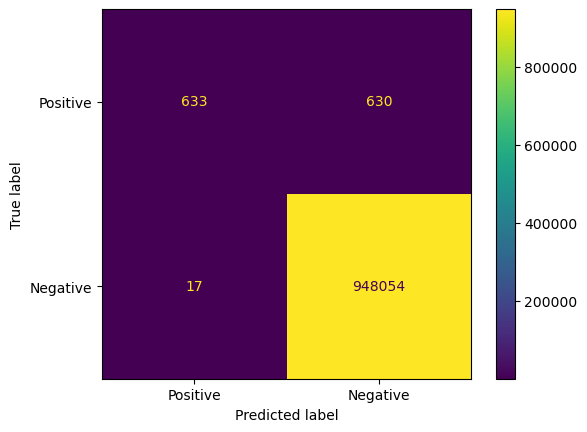

In [33]:
test(dilp_p4_T5_10_100, create_table(con, input_dir, 'df_test'), con)